In [24]:
import pandas as pd
from utils import randomSplit, Accumulator
#from torch import nn
import torch
from torch import nn
import numpy as np
from sklearn.preprocessing import StandardScaler  # 归一化
from sklearn.model_selection import KFold         # k折交叉验
from sklearn.decomposition import PCA             # pca

In [25]:
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import random
import torch_geometric.transforms as T

def rank2class(df):
    if df['LgRk'] <= 6:
        return 0
    elif 6 < df['LgRk'] <= 13:
        return 1
    else:
        return 2
class myDataset():
    def __init__(self, renorm=False, pca=False, method='knn', **kargs):
        self.player = pd.read_csv('DLdata\outfielder_combined_from_raw_fillna.csv', header=0, encoding='utf-8')
        self.player = self.player.drop(['Player', 'Pos', 'Comp', 'Age', 'Born'], axis=1)
        # Squad 和 Season 需要保留
        #self.player = self.player.drop(['Rk', 'Player', 'Nation', 'Pos', 'Comp', 'Age', 'Born'], axis=1)
        
        if renorm:
            scaler = StandardScaler()  # z score 归一化
            for col in self.player.columns:
                if col in ('Squad', "Season"): continue
                self.player[[col]] = scaler.fit_transform(self.player[[col]])
        if pca:
            squad = self.player['Squad']
            season = self.player['Season']
            values = self.player.drop(['Squad', 'Season'], axis=1).values
            comp_dim = kargs['pca_dim']
            pca = PCA(n_components=comp_dim)   # 15
            values = pca.fit_transform(values)
            # print(sum(pca.explained_variance_ratio_))
            self.player = pd.DataFrame(values)
            self.player['Squad'] = squad
            self.player["Season"] = season

        self.league = pd.read_excel('DLdata/SquadPerformance2021.xlsx', sheet_name='Sheet1')
        self.league['tier'] = self.league.apply(rank2class, axis=1)
        self.league = self.league[['Squad', 'Season', 'tier']]       



        # 生成连续的变量
        self.X = []  # in GNN: list of Data object; in CNN: list of 2-dim tensors; in MLs list of 1-dim tensors
        self.y = []
        for id in self.league.index:
            squad = self.league.at[id, 'Squad']
            season = self.league.at[id, 'Season']
            if season == 2021: continue  # 发现github的数据在2021年仅仅只有前几场比赛的，所以不得不舍弃了orzzz
            data = self.Squad2Player(squad, season, method, **kargs)
            data.y = torch.LongTensor([self.league.at[id, 'tier']])
            self.X.append(data) 

            self.y.append(self.league.at[id, 'tier'])  # 作为监督的label

        #self.X = torch.cat(self.X, axis=0)  # list of Data objects
        #self.X = self.X.numpy()
        #self.y = np.array(self.y)  y没用捏
    
    def shuffle(self):
        '''shuffle X'''
        random.shuffle(self.X)

        

    def Squad2Player(self, squad, season, method, **kargs):
        "输入squad的名字，输出球队球员的数据"
        season = str(season) + '-' + str(int(season) + 1)
        re = self.player[self.player['Squad'] == squad]
        #print(re.columns)
        re = re[re['Season'] == season].drop(['Squad', 'Season'], axis=1)
        re = torch.Tensor(re.values)  # shape [nplayers, features]
        # print(re.shape) [20, 151]

        # GNN 需要做的事spectral cluster
        assert method in ('knn', 'epsilonNear', 'fullconnection')  # 参考 https://www.cnblogs.com/pinard/p/6221564.html
        if method == 'knn':
            k = kargs['k']
            sim_matrix = torch.matmul(re, re.T)  # 内积作为相似度的度量  shape [nplayers, nplayers]
            diag = torch.diag(sim_matrix)  # 取 sim_matrix 对角线元素，输出为 
            a_diag = torch.diag_embed(diag)  # 由 diag 恢复为矩阵
            sim_matrix = sim_matrix - a_diag  # 对角线置0
            knearest = torch.topk(sim_matrix, k=k, dim=1).indices  # shape [nplayers, k]
            dim0, dim1 = knearest.shape
            edge_index = []  # knearest构成的边的list
            # 遍历张量
            flag = True  # 1，说明要考虑是否满足互为k近邻
            for i in range(dim0):
                for j in range(dim1):
                    if flag:  # 如果满足，则说明存在一个pair，不满足说明不存在，互为k近邻
                        cond = knearest[j]  # 取第j行
                        if torch.where(cond == i, torch.ones((1, k)), torch.zeros((1, k))).sum() == 0:
                            continue
                    edge_index.append(torch.LongTensor([[i, knearest[i][j]]]))
            
            edge_index = torch.cat(edge_index, dim=0)  # shape [nplayers, 2]
            data = Data(x=re, edge_index=edge_index.T)
        elif method == 'epsilonNear':
            eps = kargs['epsilonNear']
            sim_matrix = torch.matmul(re, re.T)  # 内积作为相似度的度量  shape [nplayers, nplayers]
            diag = torch.diag(sim_matrix)  # 取 sim_matrix 对角线元素，输出为 
            a_diag = torch.diag_embed(diag)  # 由 diag 恢复为矩阵
            sim_matrix = sim_matrix - a_diag  # 对角线置0
            #edge_adj = sim_matrix > eps
            edge_index = torch.nonzero(sim_matrix > eps) # torch.nonzero 也能选出非 false 的值，shape [edges_num, 2]
            data = Data(x=re, edge_index=edge_index.T)

        elif method == 'fullconnection':
            # 这种方法整体上好像确实不行啊
            sim_matrix = torch.matmul(re, re.T)  # 内积作为相似度的度量  shape [nplayers, nplayers]
            #edge_adj = sim_matrix > eps
            edge_index = torch.nonzero(sim_matrix >= 0) # torch.nonzero 也能选出非 false 的值，shape [edges_num, 2]
            
            data = Data(x=re, edge_index=edge_index.T)
        #r = T.to_undirected   # 新加上的一行，不保证效果orzzz
        #data = r(data)
        return data
            

    
    # 使用K折交叉验证
    def DataIter(self, K=10, shuffle=True):
        KF = KFold(n_splits=K, shuffle=shuffle)
        #self.X = np.array(self.X)  不可以这样转换
        for train_index, valid_index in KF.split(self.X):
            #print("TRAIN", train_index, "TEST", test_index)
            X_train, X_valid = [], []
            for idx in train_index:
                X_train.append(self.X[idx])
            for idx in valid_index:
                X_valid.append(self.X[idx])
            #Y_train, Y_test = self.y[train_index], self.y[test_index]
            yield X_train, X_valid
    

def draw_loss(train_recorder: Accumulator, valid_recorder: Accumulator):
    train_recorder.clear()
    valid_recorder.clear()
    import matplotlib.pyplot as plt
    num_epoch = len(train_recorder.backup)
    epoch_l = [i for i in range(1, num_epoch+1)]
    y1 = train_recorder.read_backup(1)
    y2 = valid_recorder.read_backup(1)

    y3 = train_recorder.read_backup(0)
    y4 = valid_recorder.read_backup(0)

    plt.figure(figsize=(18, 6), dpi=100)
    plt.rc("font", family='MicroSoft YaHei', weight="bold")

    plt.subplot(1, 2, 1)
    plt.xlabel('epoch')
    plt.ylabel('F1-score')
    plt.plot(epoch_l, y1, color='red', linestyle=':', label='train set')
    plt.plot(epoch_l, y2, color='green', linestyle='-.', label='valid set')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.plot(epoch_l, y3, color='red', linestyle=':', label='train set')
    plt.plot(epoch_l, y4, color='green', linestyle='-.', label='valid set')
    plt.legend()
    
    plt.show()

mydataset = myDataset(renorm=1 ,pca=0, pca_dim=10, method='epsilonNear', epsilonNear=150)
print(mydataset.X[7].edge_index)

tensor([[ 0,  0,  0,  0,  0,  0,  0,  0,  3,  3,  3,  3,  3,  3,  5,  5,  5,  9,
          9,  9,  9,  9, 11, 11, 11, 11, 11, 11, 11, 12, 12, 12, 12, 13, 13, 13,
         13, 13, 13, 13, 14, 14, 14, 16, 16, 16, 16, 16],
        [ 3,  5,  9, 11, 12, 13, 14, 16,  0, 11, 12, 13, 14, 16,  0,  9, 13,  0,
          5, 11, 13, 16,  0,  3,  9, 12, 13, 14, 16,  0,  3, 11, 13,  0,  3,  5,
          9, 11, 12, 16,  0,  3, 11,  0,  3,  9, 11, 13]])


In [26]:
from sklearn.metrics import f1_score
import torch.nn.functional as F
from torch_geometric.nn import GINConv
from torch_geometric.nn import global_mean_pool, global_add_pool, global_max_pool, Set2Set

def train(model, loss, trainloader, validloader, batch_size, num_epochs, lr, device, verbos=True):
    # 初始化参数
    #def init_weight(m):
    #    if type(m) == nn.Linear or type(m) == nn.BatchNorm1d or type(m) == GINConv:
    #        nn.init.xavier_uniform_(m.weight)
    #model.apply(init_weight)
    if verbos:
        print(f'training on: {device}')
    model.to(device)

    optimizer = torch.optim.Adam([p for p in model.parameters() if p.requires_grad==True], lr=lr)
    recorder = Accumulator(3)
    validRecorder = Accumulator(3)
    for epoch in range(num_epochs):
        # 训练集梯度，训练集正确率，训练集总数
        model.train()
        for dataBatch in trainloader:
            optimizer.zero_grad()
            dataBatch = dataBatch.to(device)
            y = dataBatch.y
            yhat = model(dataBatch)
            l = loss(yhat, y)
            l.backward()
            optimizer.step()
            
            f1 = f1_score(y.cpu(), yhat.cpu().argmax(dim=1), average='micro')
            recorder.add(float(l), f1, dataBatch.batch_size) #说明lossfun里，梯度除以了bachsize

        # 正确率和平均损失
        model.eval()
        # 验证集梯度，训练集正确率，训练集总数
        for dataBatch in validloader:
            dataBatch = dataBatch.to(device)
            y = dataBatch.y
            yhat = model(dataBatch)
            l = loss(yhat, y)
            f1 = f1_score(y.cpu(), yhat.cpu().argmax(dim=1), average='micro')
            validRecorder.add(float(l), f1, dataBatch.batch_size) #说明lossfun里，梯度除以了bachsize

        if verbos:
            print(f'epoch = {epoch+1}')
            print(f'训练集F1-score：{recorder[1]:.3f}，训练集平均loss {recorder[0]:.3f}.', end=' ')
            print(f'验证集F1-score：{validRecorder[1]:.3f}，验证集平均loss {validRecorder[0]:.3f}.')
        recorder.clear()
        validRecorder.clear()
        
    return recorder, validRecorder

In [27]:
# 我自己写一个position embedding 的模块吧
from utils import train_posi_embed   # PosiEmbedding, NegativeSamplingLoss

# 调参发现，JK = sum 和 residual = True 效果都很不好
class MyGINClasiifier(nn.Module):
    def __init__(self, player_features_dim, emd_dim, num_tasks, num_layers=2, palyar_trans='pca', 
                 message_aggregate_method='add', drop_ratio=0.5, JK="last", residual=False, graph_pooling='sum', device='cpu'):
        super(MyGINClasiifier, self).__init__()
        #torch.manual_seed(12345)
        self.drop_ratio = drop_ratio
        self.residual = residual
        self.JK = JK
        self.num_layers = num_layers
        self.emd_dim = emd_dim
        self.num_tasks = num_tasks
        self.palyar_trans = palyar_trans
        self.device = device
        
        assert palyar_trans in ('pca', 'mlp', 'random', 'position')
        if palyar_trans == 'pca': pass  # 这个在数据集上会搞定
        elif palyar_trans == 'random': pass  # 在forward上修改
        elif palyar_trans == 'mlp':
            self.player2embed = nn.Sequential(nn.Linear(player_features_dim, emd_dim),
                                                     nn.BatchNorm1d(emd_dim), nn.ReLU())
        elif palyar_trans == 'position':
            #train_posi_embed()
            pass


        self.convs = torch.nn.ModuleList()
        self.batch_norms = torch.nn.ModuleList()

        for layer in range(num_layers):
            self.convs.append(GINConv(nn.Sequential(nn.Linear(emd_dim, emd_dim),
                                                     nn.BatchNorm1d(emd_dim), nn.ReLU(),
                                                       nn.Linear(emd_dim, emd_dim)), aggr=message_aggregate_method))
            self.batch_norms.append(torch.nn.BatchNorm1d(emd_dim))

        
        # Pooling function to generate whole-graph embeddings
        if graph_pooling == "sum":
            self.pool = global_add_pool
        elif graph_pooling == "mean":
            self.pool = global_mean_pool
        elif graph_pooling == "max":
            self.pool = global_max_pool
        #elif graph_pooling == "attention":
        #    self.pool = GlobalAttention(gate_nn=nn.Sequential(
        #        nn.Linear(emb_dim, emb_dim), nn.BatchNorm1d(emb_dim), nn.ReLU(), nn.Linear(emb_dim, 1)))
        #elif graph_pooling == "set2set":
        #    self.pool = Set2Set(emb_dim, processing_steps=2)
        else:
            raise ValueError("Invalid graph pooling type.")

        if graph_pooling == "set2set":
            self.graph_pred_linear = nn.Linear(2*self.node_fearue_dim, self.num_tasks)
        
        elif JK == 'concat':
            self.graph_pred_linear = nn.Sequential(nn.Linear(emd_dim * (1 + num_layers), emd_dim),
                                                      nn.BatchNorm1d(emd_dim), nn.ReLU(), nn.Dropout(p=self.drop_ratio),
                                                       nn.Linear(emd_dim, emd_dim))
        else:
            self.graph_pred_linear = nn.Linear(self.node_fearue_dim, self.num_tasks)


    def forward(self, databatch):
        x, edge_index, batch = databatch.x, databatch.edge_index, databatch.batch
        # x shape [numnodes, features]
        if self.palyar_trans == 'mlp':
            x = self.player2embed(x)
        elif self.palyar_trans == 'random':
            x = torch.randn((x.shape[0], self.emd_dim), device=self.device)
        elif self.palyar_trans == 'position':  # 这其实意味着，position embeding其实是用一次就废弃了的
            posiNet, recorder = train_posi_embed(databatch.cpu(), self.emd_dim, epoches=5)  # 需要把东西先放为cpu
            ids = torch.LongTensor(range(databatch.num_nodes)) # [num_nodes]
            x = posiNet.forward_input(ids)
            x = x.to(self.device)  # 移动到网络的设备上面


        h_list = [x]
        for layer in range(self.num_layers):
            h = self.convs[layer](h_list[layer], edge_index)
            h = self.batch_norms[layer](h)
            if layer == self.num_layers - 1:
                # remove relu for the last layer
                h = F.dropout(h, self.drop_ratio, training=self.training)
            else:
                h = F.dropout(F.relu(h), self.drop_ratio, training=self.training)

            if self.residual:
                h += h_list[layer]

            h_list.append(h)

        # Different implementations of Jk-concat
        # JK (str, optional): 可选的值为"last"和"sum"。选"last"，只取最后一层的结点的嵌入，选"sum"对各层的结点的嵌入求和。Defaults to "last".
        if self.JK == "last":
            node_representation = h_list[-1]
        elif self.JK == "sum":
            node_representation = 0
            for layer in range(self.num_layers + 1):
                node_representation += h_list[layer]
        elif self.JK == "concat":
            node_representation = torch.concat(h_list, dim=1)
            # print(node_representation.shape) 
        

        # global pooling
        h_graph = self.pool(node_representation, batch)

        output = self.graph_pred_linear(h_graph)
        return output


In [34]:
# read data
emd_dim = 40   # 60 is best，后面再改一个函数，改成不同的input dim和。然后concat的情况，似乎是40最好
#mydataset = myDataset(renorm=1 ,pca=0, pca_dim=pca_dim, method='knn', k=4)  # k越高约好是吧，目前是10最好，再多也没有见着变差
mydataset = myDataset(renorm=1 , method='epsilonNear', epsilonNear=100) # 100 150 200   150和200最好
# hyperparameters
device = 'cuda:0'
train_split = 0.7
batch_size = 10
lr = 0.01
epochs = 150   # 
# pca被mlp薄纱了，在full info的情况下
# position 的效果没有比 random更好，而且慢了很多orzzz
model = MyGINClasiifier(player_features_dim=151, emd_dim=emd_dim, num_tasks=3, palyar_trans='random', num_layers=5, JK='concat', device=device)
loss = nn.CrossEntropyLoss(label_smoothing=0.1)

div = int(train_split * (len(mydataset.X)))  # 392个，总比98个强吧，嗨嗨嗨
trainloader = DataLoader(mydataset.X[:div], batch_size=batch_size, shuffle=True)
validloader = DataLoader(mydataset.X[div:], batch_size=batch_size, shuffle=True)

a, b = train(model=model, loss=loss, trainloader=trainloader, validloader=validloader, batch_size=batch_size, num_epochs=epochs, lr=lr, device=device)

training on: cuda:0
epoch = 1
训练集F1-score：0.457，训练集平均loss 2.244. 验证集F1-score：0.625，验证集平均loss 2.840.
epoch = 2
训练集F1-score：0.493，训练集平均loss 1.676. 验证集F1-score：0.588，验证集平均loss 1.750.
epoch = 3
训练集F1-score：0.466，训练集平均loss 1.641. 验证集F1-score：0.604，验证集平均loss 1.710.
epoch = 4
训练集F1-score：0.493，训练集平均loss 1.611. 验证集F1-score：0.602，验证集平均loss 1.506.
epoch = 5
训练集F1-score：0.487，训练集平均loss 1.602. 验证集F1-score：0.608，验证集平均loss 1.594.
epoch = 6
训练集F1-score：0.443，训练集平均loss 1.637. 验证集F1-score：0.656，验证集平均loss 1.459.
epoch = 7
训练集F1-score：0.470，训练集平均loss 1.607. 验证集F1-score：0.415，验证集平均loss 1.588.
epoch = 8
训练集F1-score：0.491，训练集平均loss 1.590. 验证集F1-score：0.675，验证集平均loss 1.464.
epoch = 9
训练集F1-score：0.504，训练集平均loss 1.545. 验证集F1-score：0.550，验证集平均loss 1.616.
epoch = 10
训练集F1-score：0.491，训练集平均loss 1.583. 验证集F1-score：0.615，验证集平均loss 1.712.
epoch = 11
训练集F1-score：0.473，训练集平均loss 1.570. 验证集F1-score：0.688，验证集平均loss 1.468.
epoch = 12
训练集F1-score：0.477，训练集平均loss 1.613. 验证集F1-score：0.652，验证集平均loss 1.518.
epoch = 13
训练集F1-

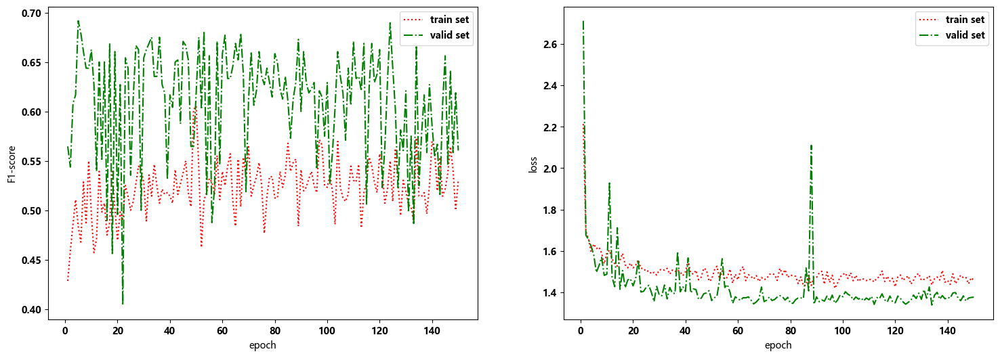

In [ ]:
draw_loss(a, b)

C:\Users\xxxx\AppData\Local\Temp\ipykernel_76032\1898901345.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure()


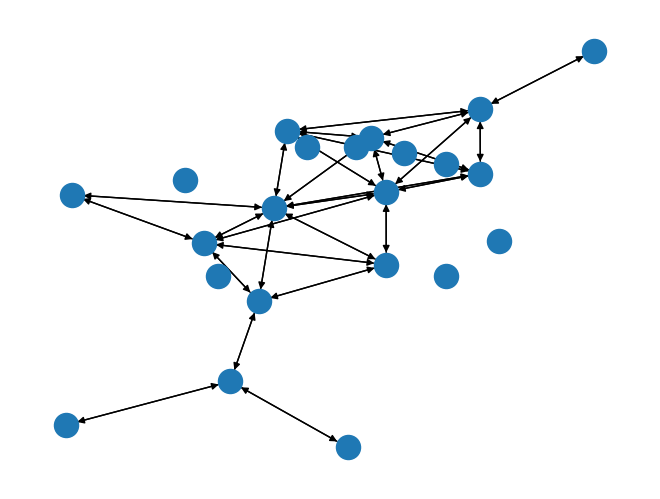

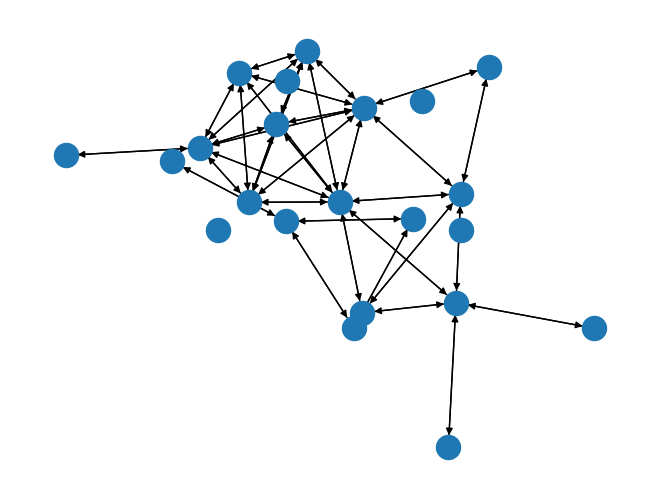

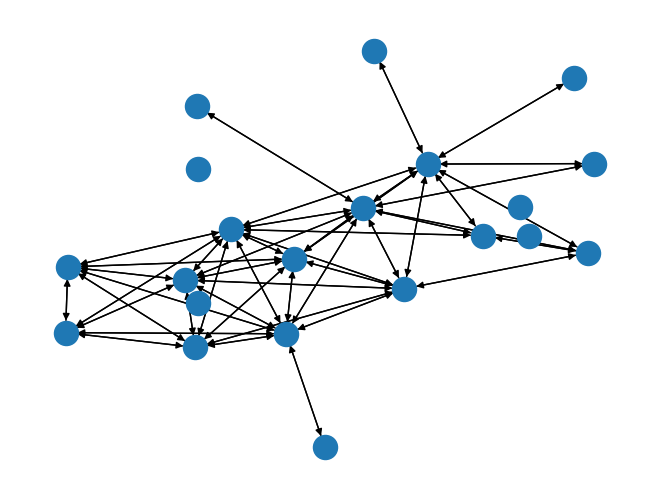

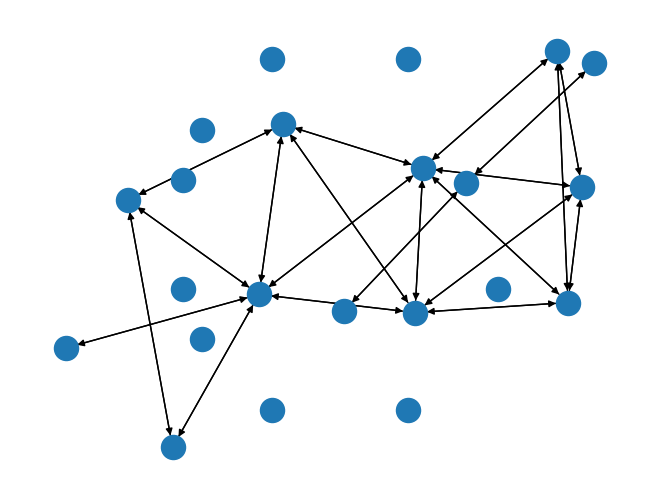

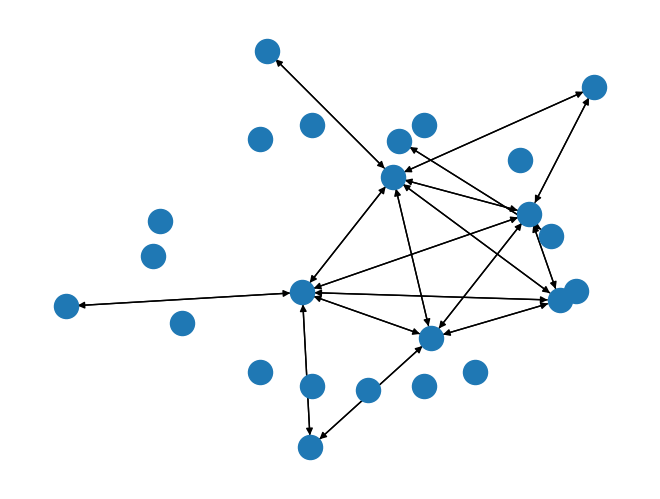

...

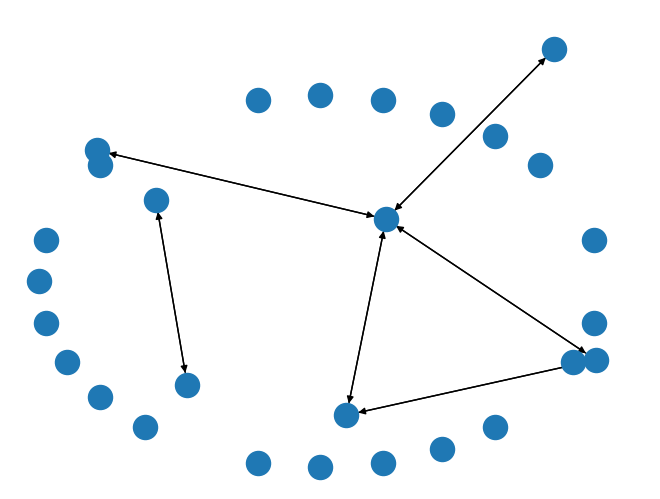

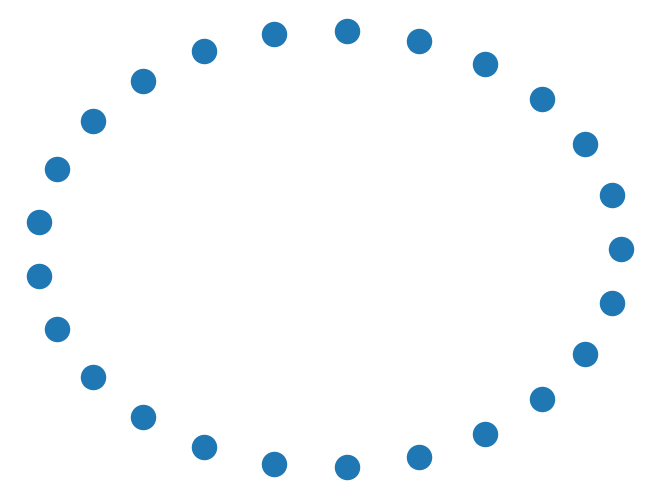

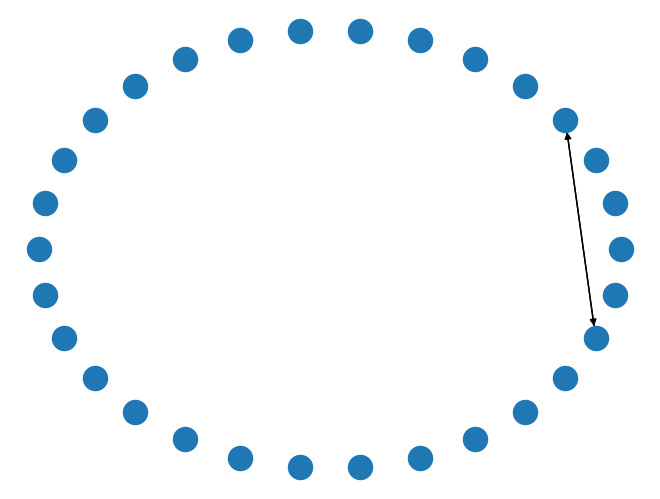

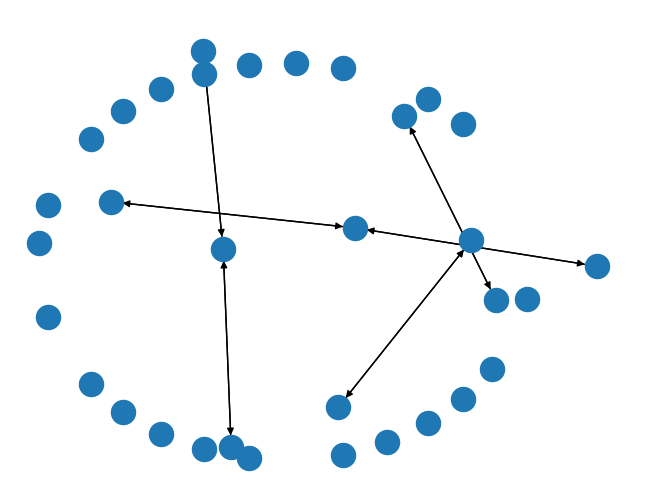

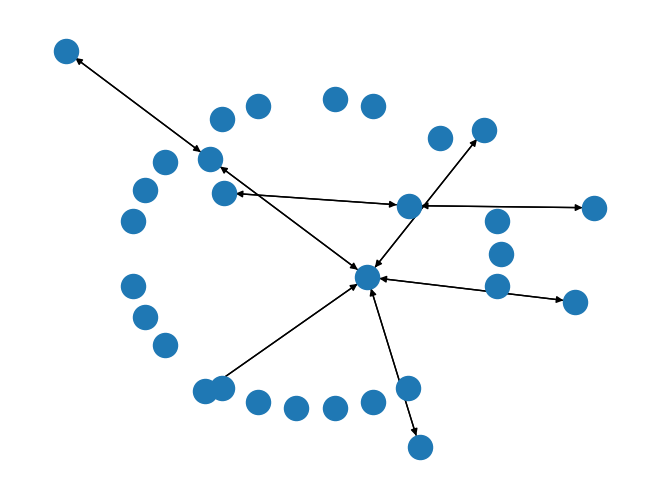

In [33]:
# 做可解释性，把所有图片画出来！！！
eps = 100
mydataset = myDataset(renorm=1 , method='epsilonNear', epsilonNear=eps)

import os
from torch_geometric.utils.convert import to_networkx
import networkx as nx
import matplotlib.pyplot as plt
def drw_Data_obj(obj: Data, save=False):
    #print(obj)
    #print(obj.edge_index)
    target = str(int(obj.y))
    if not os.path.isdir(target + f"_eps_{eps}"):
        # 创建文件夹
        os.mkdir(target + f"_eps_{eps}")
    l = os.listdir(target + f"_eps_{eps}")  # 读取一下，按照长度命名图片文件
    G = to_networkx(obj)
    f = plt.figure() 
    nx.draw(G, pos=nx.kamada_kawai_layout(G))
    f.savefig(target + f"_eps_{eps}" + f'/{len(l)}.png') 
    

best_model = model
networks = mydataset.X # list of network
#for n in networks:
    #drw_Data_obj(n)

[Data(x=[22, 151], edge_index=[2, 34], y=[1]), Data(x=[22, 151], edge_index=[2, 44], y=[1]), Data(x=[21, 151], edge_index=[2, 48], y=[1]), Data(x=[22, 151], edge_index=[2, 24], y=[1]), Data(x=[24, 151], edge_index=[2, 12], y=[1]), Data(x=[20, 151], edge_index=[2, 14], y=[1]), Data(x=[26, 151], edge_index=[2, 20], y=[1]), Data(x=[24, 151], edge_index=[2, 48], y=[1]), Data(x=[24, 151], edge_index=[2, 14], y=[1]), Data(x=[25, 151], edge_index=[2, 42], y=[1]), Data(x=[21, 151], edge_index=[2, 14], y=[1]), Data(x=[24, 151], edge_index=[2, 16], y=[1]), Data(x=[22, 151], edge_index=[2, 34], y=[1]), Data(x=[24, 151], edge_index=[2, 8], y=[1]), Data(x=[21, 151], edge_index=[2, 32], y=[1]), Data(x=[21, 151], edge_index=[2, 22], y=[1]), Data(x=[21, 151], edge_index=[2, 8], y=[1]), Data(x=[25, 151], edge_index=[2, 22], y=[1]), Data(x=[25, 151], edge_index=[2, 38], y=[1]), Data(x=[21, 151], edge_index=[2, 4], y=[1]), Data(x=[23, 151], edge_index=[2, 8], y=[1]), Data(x=[22, 151], edge_index=[2, 8], 

In [ ]:
# 目前的最佳超参数是，random，embed 40，layers 3-4，eps 150

from tqdm import tqdm
# 不变的 hyperparameters 
device = 'cuda:0'
train_split = 0.7
batch_size = 10
lr = 0.004
epochs = 200   # 

Experiment = 5
# 超参数搜索
k = [10, 13, 15, 17, 20]  # 17 20 后面人工检查一下

num_layers = [2, 3, 4, 5]
epsilonNear = [100, 120, 150, 170, 200, 220, 250]
emd_dims = [20, 30, 40, 50, 60, 70]
hyperparams = [(layer, eps, embed) for layer in num_layers for eps in epsilonNear for embed in emd_dims]
def param_search(hyperparams: list):
    pybar = tqdm(total=len(hyperparams) * Experiment * 3, desc='what?', unit='exp')
    result = dict()
    for hypers in hyperparams:
        #print(hypers)
        for exp in range(Experiment):
            
            exp_recorder = Accumulator(2)  # 存train和valid的F1-score，以估计泛化误差和过拟合情况
            mydataset = myDataset(renorm=1, method='epsilonNear', epsilonNear=hypers[1]) # 100 150 200   150和200最好
            for trainX, validX in mydataset.DataIter(K=3):
                pybar.update(1)
                #print(len(trainX))
                #print(len(validX))
                #print(type(trainX[2]))
                trainloader = DataLoader(trainX, batch_size=batch_size, shuffle=True, drop_last=True)
                validloader = DataLoader(validX, batch_size=batch_size, shuffle=True, drop_last=True)
        
                model = MyGINClasiifier(player_features_dim=151, emd_dim=hypers[2], num_tasks=3, palyar_trans='random', num_layers=hypers[0], JK='concat', device=device)
                loss = nn.CrossEntropyLoss(label_smoothing=0.1)

                trainrecorder, validrecorder = train(model=model, loss=loss, trainloader=trainloader, validloader=validloader, batch_size=batch_size, num_epochs=epochs, lr=lr, device=device, verbos=0)
                exp_recorder.add(trainrecorder.read_backup(1)[-1], validrecorder.read_backup(1)[-1])  # 累加这次试验的F1 score

        trainF1 =  np.array(exp_recorder.data[0])
        validF1 =  np.array(exp_recorder.data[1])
        result[hypers] = (trainF1.mean(), trainF1.std(), validF1.mean(), validF1.std())
        
    return result

#result = param_search(hyperparams)

In [ ]:
print(result)

NameError: name 'result' is not defined